In [1]:
%cd /home/yuchen/venv/Faster_RCNN

/home/yuchen/venv/Faster_RCNN


In [2]:
import os
import numpy as np
import cv2
import matplotlib.pyplot as plt
from PIL import Image
import random
import shutil
import os
import glob
import yaml
import xml.etree.ElementTree as ET

import torch
import torchvision
from torchvision import transforms, datasets, models
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

from torch_utils.coco_eval import CocoEvaluator
from torch_utils import utils
from torch.utils.data import Dataset, DataLoader
from torch_utils.coco_utils import get_coco_api_from_dataset

from datasets import custom_dataset

In [3]:
def collate_fn(batch):
    return tuple(zip(*batch))

def annotate(outputs, threshold, classes, colors, image):
    boxes = outputs[0]['boxes'].data.numpy()
    scores = outputs[0]['scores'].data.numpy()
    boxes = boxes[scores >= threshold].astype(np.int32)
    
    for box, score, label in zip(boxes, scores, outputs[0]['labels']):
        text = str(round(score,2))
        color = colors[label]
        cv2.rectangle(image, (box[0], box[1]), (box[2], box[3]), color, thickness=11)
        cv2.putText(image, text, (box[0], box[1] - 5), cv2.FONT_HERSHEY_SIMPLEX, 3.1 , (255,255,255), thickness=10)
    return image

In [4]:
np.random.seed(42)

with open('/home/yuchen/venv/Faster_RCNN/handicap.yaml') as file:
    configs = yaml.safe_load(file)
NUM_CLASSES = configs['NC']
CLASSES = configs['CLASSES']

# DEVICE = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
DEVICE = torch.device('cpu') 
project_name = 'final_seed_v1'

PATH = '/home/yuchen/venv/Faster_RCNN/data_sign/test_images/'
THRESHOLD = 0.5
IMG_SIZE = 1280
TEST_DIR_IMAGES = '/home/yuchen/venv/Faster_RCNN/data_sign/test_images'
TEST_DIR_IMAGES_ORIGINAL = '/home/yuchen/venv/Faster_RCNN/data_sign/test_images_original'
TEST_DIR_LABELS = '/home/yuchen/venv/Faster_RCNN/data_sign/test_labels'
BATCH_SIZE = 10
NUM_CLASSES = 2
NUM_WORKERS = 4
COLORS = np.random.uniform(0, 255, size=(len(CLASSES), 3))

In [5]:
# remove bounding boxes if they are too small
files = glob.glob(TEST_DIR_IMAGES + '/*')
files.extend(glob.glob(TEST_DIR_LABELS + '/*'))

# remove images currently in train_images and train_labels
for f in files:
    os.remove(f)
    
# copy original images and labels to train_images and train_labels folders
files = glob.glob('/home/yuchen/venv/Faster_RCNN/data_sign/test_labels_original/*')
for file_name in files:
    shutil.copy(file_name, TEST_DIR_LABELS)
    shutil.copy(file_name[:40] + 'test_images_original/' + str(file_name[-12:-4]) + '.JPG', TEST_DIR_IMAGES)

# remove too small bounding boxes in each image's label file (i.e., if their boudning box's area is less 
# than 300 when images are downscaled to 1280x1280
files = glob.glob('/home/yuchen/venv/Faster_RCNN/data_sign/test_labels/*')
for file_name in files: 
    mytree = ET.parse(file_name)
    myroot = mytree.getroot()
    img_w = int(myroot[4].find('width').text)
    img_h = int(myroot[4].find('height').text)

    lst = []
    ct = 0
    for obj in myroot.iter('object'):
        ct += 1
        xmin = int(obj.find('bndbox').find('xmin').text)
        xmax = int(obj.find('bndbox').find('xmax').text)
        ymin = int(obj.find('bndbox').find('ymin').text)
        ymax = int(obj.find('bndbox').find('ymax').text)

        w = xmax-xmin
        h = ymax-ymin
        w = w / img_w * 1280
        h = h / img_h * 1280
        
        if w*h <= 300:
            lst.append(obj)
            
    if len(lst) != 0:
        if ct == len(lst):
            os.remove(file_name)
            os.remove(glob.glob('/home/yuchen/venv/Faster_RCNN/data_sign/' + file_name[40:44] + '_images/' + file_name[52:-4] + '*')[0])
            print('removed the entire file ' + file_name)
        else: 
            for i in reversed(lst):
                myroot.remove(i)
            print('removed ' + str(len(lst)) + ' bounding boxes from ' + file_name)
            mytree.write(file_name)

removed 1 bounding boxes from /home/yuchen/venv/Faster_RCNN/data_sign/test_labels/GOPR6760.xml
removed 1 bounding boxes from /home/yuchen/venv/Faster_RCNN/data_sign/test_labels/GOPR6798.xml
removed 4 bounding boxes from /home/yuchen/venv/Faster_RCNN/data_sign/test_labels/GOPR6732.xml
removed 2 bounding boxes from /home/yuchen/venv/Faster_RCNN/data_sign/test_labels/GOPR6707.xml
removed the entire file /home/yuchen/venv/Faster_RCNN/data_sign/test_labels/GOPR6638.xml
removed 2 bounding boxes from /home/yuchen/venv/Faster_RCNN/data_sign/test_labels/GOPR6763.xml
removed 1 bounding boxes from /home/yuchen/venv/Faster_RCNN/data_sign/test_labels/GOPR6632.xml
removed 1 bounding boxes from /home/yuchen/venv/Faster_RCNN/data_sign/test_labels/GOPR6570.xml
removed the entire file /home/yuchen/venv/Faster_RCNN/data_sign/test_labels/GOPR6657.xml
removed 1 bounding boxes from /home/yuchen/venv/Faster_RCNN/data_sign/test_labels/GOPR6797.xml


In [6]:
# remove the third color channel of all images
files = glob.glob('/home/yuchen/venv/Faster_RCNN/data_sign/test_images/*')
for file_name in files:
    img_copy  = Image.open(file_name).copy().convert('L')
    img = np.array(Image.open(file_name).copy())
    img[:,:,2] = img_copy
    img = Image.fromarray(img).copy()
    img.save(file_name)

In [7]:
# load images
test_images = []
image_file_types = ['*.jpg','*.jpeg','*.png','*.JPG']
for file_type in image_file_types:
    test_images.extend(glob.glob(PATH + '*' + file_type))

# load model
model = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(
        weights=torchvision.models.detection.FasterRCNN_ResNet50_FPN_V2_Weights.DEFAULT,
        trainable_backbone_layers = 2)    
in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_features, NUM_CLASSES) 

# load weights to the model
checkpoint = torch.load('/home/yuchen/venv/Faster_RCNN/outputs/training/' + project_name + '/best_model.pth', map_location=DEVICE)
model.load_state_dict(checkpoint['model_state_dict'])
model.to(DEVICE).eval()

# load data
test_dataset = custom_dataset(TEST_DIR_IMAGES, TEST_DIR_LABELS, IMG_SIZE, IMG_SIZE, CLASSES, train=False)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, 
                              shuffle=False, num_workers=NUM_WORKERS,collate_fn=collate_fn)

In [8]:
# evaluate the mAP on the test set
# adapted from torchvision's library: https://github.com/pytorch/vision/blob/main/references/detection/engine.py
def evaluate(model, data_loader, device):
    model.eval()
    metric_logger = utils.MetricLogger(delimiter="  ")

    coco = get_coco_api_from_dataset(data_loader.dataset)
    coco_evaluator = CocoEvaluator(coco, ["bbox"])

    for images, targets in metric_logger.log_every(data_loader, 100,  "Test:"):
        images = list(img.to(device) for img in images)
        outputs = model(images)
        outputs = [{k: v.to(device) for k, v in t.items()} for t in outputs]
        res = {target["image_id"].item(): output for target, output in zip(targets, outputs)}
        coco_evaluator.update(res)

    # gather the stats from all processes
    coco_evaluator.synchronize_between_processes()

    # accumulate predictions from all images
    coco_evaluator.accumulate()
    stats = coco_evaluator.summarize()
    return coco_evaluator, stats

In [9]:
coco_evaluator, stats = evaluate(model, test_loader, DEVICE)

creating index...
index created!
Accumulating evaluation results...
DONE (t=0.00s).
IoU metric: bbox
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.501
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.732
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.584
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.308
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.673
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = -1.000
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.232
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.560
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.573
 Average Recall     (AR) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.393
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.733
 Average Recall   

Total number of images: 35


/tmp/ipykernel_1723114/3832054041.py:24: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(6,6))


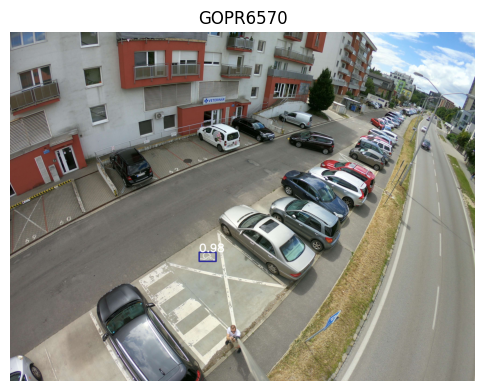

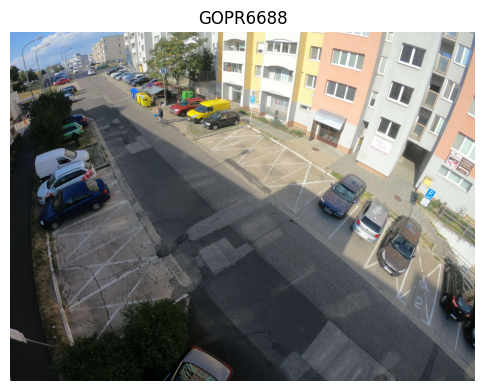

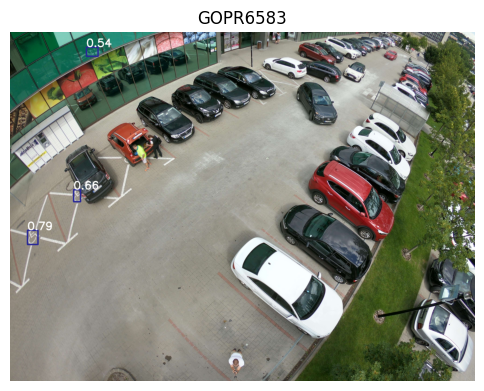

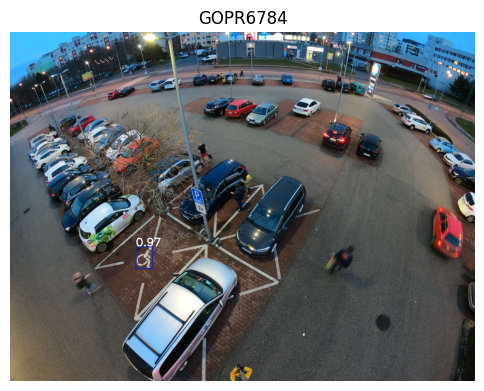

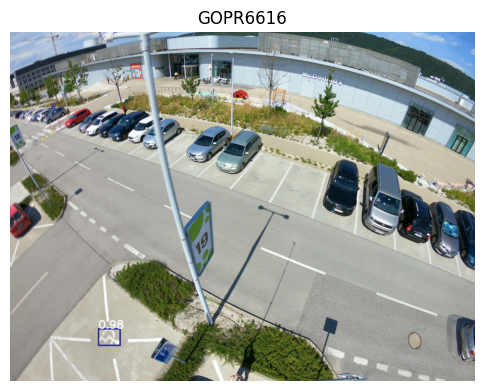

...

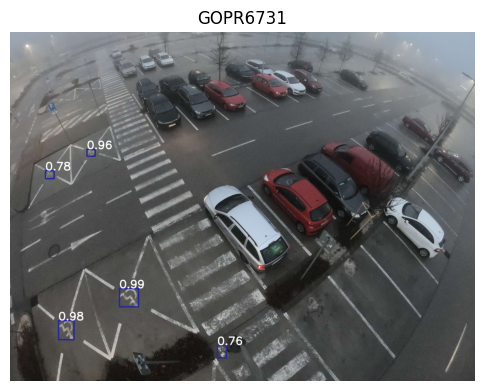

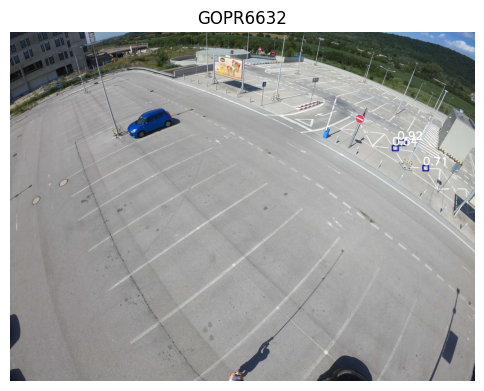

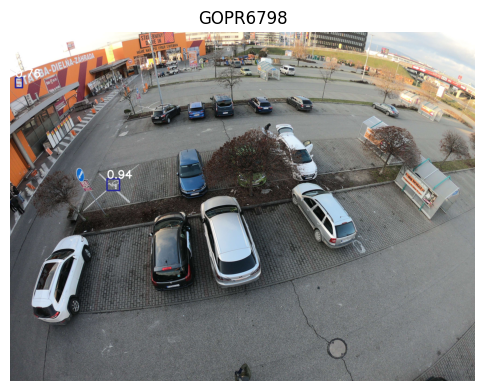

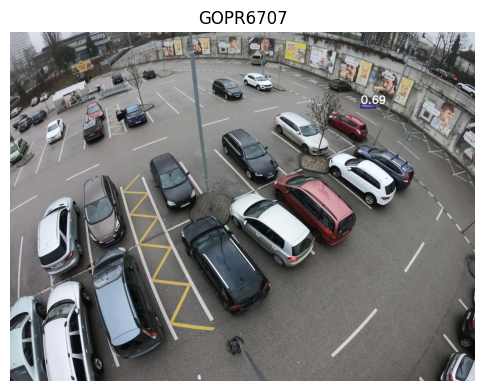

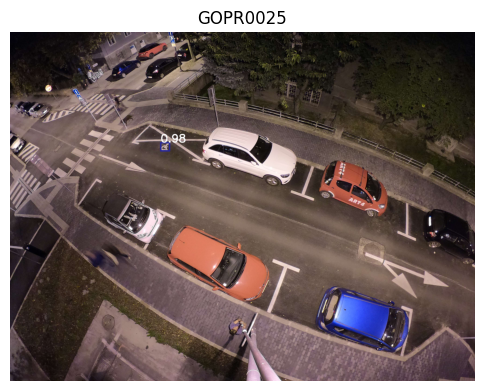

In [10]:
# load images
test_images = []
image_file_types = ['*.jpg', '*.jpeg', '*.png','*.JPG']
for file_type in image_file_types:
    test_images.extend(glob.glob(TEST_DIR_IMAGES + '/' + file_type))
print('Total number of images: ' + str(len(test_images)))

# predict
for i in range(len(test_images)):
    image_name = test_images[i].split(os.path.sep)[-1].split('.')[0]
    image_original = cv2.imread(TEST_DIR_IMAGES_ORIGINAL + '/' + image_name + '.JPG')
    image = cv2.imread(test_images[i])
    image_o = image.copy()
        
    trans = transforms.Compose([transforms.ToPILImage(),transforms.ToTensor()])
    image = torch.unsqueeze(trans(cv2.cvtColor(image_o, cv2.COLOR_BGR2RGB)), 0)
    with torch.no_grad():
        outputs = model(image.to(DEVICE))
    outputs = [{k: v.to('cpu') for k, v in t.items()} for t in outputs]
    
    # annotate
    if len(outputs[0]['boxes']) != 0:
        image_original = annotate(outputs, THRESHOLD, CLASSES, COLORS, image_original)
        plt.figure(figsize=(6,6))
        plt.axis('off')
        plt.title(image_name)
        plt.imshow(cv2.cvtColor(image_original, cv2.COLOR_BGR2RGB))
'''
note: here I only showed the confidence score for each image, 
because if I add the predicted class (which is "handicap" because we are only detecting this class),
some numbers will be outside of the image boundary. 
'''        
